In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Loan predictions

## Problem Statement

We want to automate the loan eligibility process based on customer details that are provided as online application forms are being filled. You can find the dataset [here](https://drive.google.com/file/d/1h_jl9xqqqHflI5PsuiQd_soNYxzFfjKw/view?usp=sharing). These details concern the customer's Gender, Marital Status, Education, Number of Dependents, Income, Loan Amount, Credit History and other things as well. 

|Variable| Description|
|:------------- |:-------------|
|Loan_ID| Unique Loan ID|
|Gender| Male/ Female|
|Married| Applicant married (Y/N)|
|Dependents| Number of dependents|
|Education| Applicant Education (Graduate/ Under Graduate)|
|Self_Employed| Self employed (Y/N)|
|ApplicantIncome| Applicant income|
|CoapplicantIncome| Coapplicant income|
|LoanAmount| Loan amount in thousands|
|Loan_Amount_Term| Term of loan in months|
|Credit_History| credit history meets guidelines|
|Property_Area| Urban/ Semi Urban/ Rural|
|Loan_Status| Loan approved (Y/N)



### Explore the problem in following stages:

1. Hypothesis Generation – understanding the problem better by brainstorming possible factors that can impact the outcome
2. Data Exploration – looking at categorical and continuous feature summaries and making inferences about the data.
3. Data Cleaning – imputing missing values in the data and checking for outliers
4. Feature Engineering – modifying existing variables and creating new ones for analysis
5. Model Building – making predictive models on the data

## 1. Hypothesis Generation

Generating a hypothesis is a major step in the process of analyzing data. This involves understanding the problem and formulating a meaningful hypothesis about what could potentially have a good impact on the outcome. This is done BEFORE looking at the data, and we end up creating a laundry list of the different analyses which we can potentially perform if data is available.

#### Possible hypotheses
Which applicants are more likely to get a loan

1. Applicants having a credit history 
2. Applicants with higher applicant and co-applicant incomes
3. Applicants with higher education level
4. Properties in urban areas with high growth perspectives

Do more brainstorming and create some hypotheses of your own. Remember that the data might not be sufficient to test all of these, but forming these enables a better understanding of the problem.

## 2. Data Exploration
Let's do some basic data exploration here and come up with some inferences about the data. Go ahead and try to figure out some irregularities and address them in the next section. 

In [70]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

df = pd.read_csv('../data/data.csv')
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


One of the key challenges in any data set are missing values. Lets start by checking which columns contain missing values.

In [3]:
# Missing values check
print('\n\nMissing values check:\n')
print(df.isnull().sum())


# number unique values, only those under 100
print('\n\nnumber unique values, only under 100:\n')
print(df.nunique()[df.nunique() < 100])


# Loan_Amount_Term unique values
print('\n\nLoan_Amount_Term unique values:\n')
print(df['Loan_Amount_Term'].unique())



Missing values check:

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64


number unique values, only under 100:

Gender               2
Married              2
Dependents           4
Education            2
Self_Employed        2
Loan_Amount_Term    10
Credit_History       2
Property_Area        3
Loan_Status          2
dtype: int64


Loan_Amount_Term unique values:

[360. 120. 240.  nan 180.  60. 300. 480.  36.  84.  12.]


Look at some basic statistics for numerical variables.

1. How many applicants have a `Credit_History`? (`Credit_History` has value 1 for those who have a credit history and 0 otherwise)
2. Is the `ApplicantIncome` distribution in line with your expectation? Similarly, what about `CoapplicantIncome`?
3. Tip: Can you see a possible skewness in the data by comparing the mean to the median, i.e. the 50% figure of a feature.



In [4]:
# Basic statistics for numerical variables
print('\n\nBasic statistics for numerical variables:\n')
print(df.describe())




Basic statistics for numerical variables:

       ApplicantIncome  CoapplicantIncome  LoanAmount  Loan_Amount_Term  \
count       614.000000         614.000000  592.000000         600.00000   
mean       5403.459283        1621.245798  146.412162         342.00000   
std        6109.041673        2926.248369   85.587325          65.12041   
min         150.000000           0.000000    9.000000          12.00000   
25%        2877.500000           0.000000  100.000000         360.00000   
50%        3812.500000        1188.500000  128.000000         360.00000   
75%        5795.000000        2297.250000  168.000000         360.00000   
max       81000.000000       41667.000000  700.000000         480.00000   

       Credit_History  
count      564.000000  
mean         0.842199  
std          0.364878  
min          0.000000  
25%          1.000000  
50%          1.000000  
75%          1.000000  
max          1.000000  




count the nuber of 1 in Credit_History, and the percentage of 1:

1.0    475
0.0     89
Name: Credit_History, dtype: int64
1.0    0.842199
0.0    0.157801
Name: Credit_History, dtype: float64


Histogram of ApplicantIncome:



Boxplot of ApplicantIncome and LoanAmount by Education:



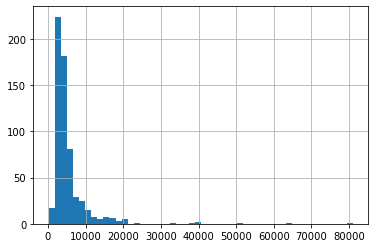

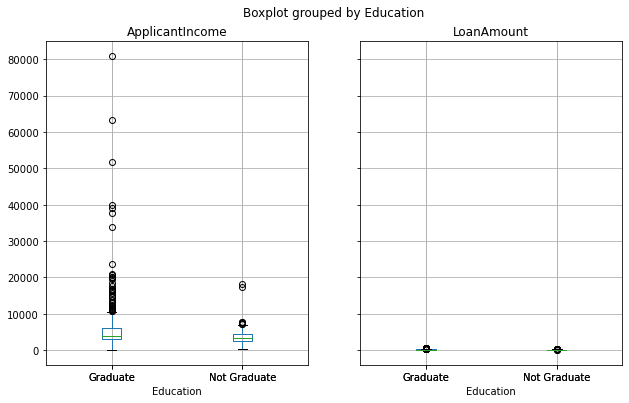

In [5]:


# count the nuber of 1 in Credit_History, and the percentage of 1
print('\n\ncount the nuber of 1 in Credit_History, and the percentage of 1:\n')
print(df['Credit_History'].value_counts())
print(df['Credit_History'].value_counts(normalize=True))




# Histogram of ApplicantIncome
print('\n\nHistogram of ApplicantIncome:\n')
_ = df['ApplicantIncome'].hist(bins=50)


# Boxplot of ApplicantIncome and LoanAmount by Education
print('\n\nBoxplot of ApplicantIncome and LoanAmount by Education:\n')
_ = df.boxplot(column=['ApplicantIncome', 'LoanAmount'], by='Education', figsize=(10, 6))

Let's discuss nominal (categorical) variable. Look at the number of unique values in each of them.

In [6]:
# size of the dataframe
print('\n\nsize of the dataframe:\n')
print(df.shape)

# Number of unique values in categorical variables
print('\n\nNumber of unique values in categorical variables:\n')
for col in df.select_dtypes(include='object').columns:
    print(f"{col}: {df[col].nunique()} unique values")







size of the dataframe:

(614, 13)


Number of unique values in categorical variables:

Loan_ID: 614 unique values
Gender: 2 unique values
Married: 2 unique values
Dependents: 4 unique values
Education: 2 unique values
Self_Employed: 2 unique values
Property_Area: 3 unique values
Loan_Status: 2 unique values


Explore further using the frequency of different categories in each nominal variable. Exclude the ID obvious reasons.

In [7]:
# given

# Loan_ID: 614 unique values
# Gender: 2 unique values
# Married: 2 unique values
# Dependents: 4 unique values
# Education: 2 unique values
# Self_Employed: 2 unique values
# Property_Area: 3 unique values
# Loan_Status: 2 unique values

# Explore further using the frequency of different categories in each nominal variable. Exclude the ID obvious reasons.

# Frequency of different categories in each nominal variable
print('\n\nFrequency of different categories in each nominal variable:\n')
for col in df.select_dtypes(include='object').columns:
    if col != 'Loan_ID':
        print(f"\n\n{col}:\n{df[col].value_counts()}")
        print(f"\n{col}:\n{df[col].value_counts(normalize=True)}")
        



Frequency of different categories in each nominal variable:



Gender:
Male      489
Female    112
Name: Gender, dtype: int64

Gender:
Male      0.813644
Female    0.186356
Name: Gender, dtype: float64


Married:
Yes    398
No     213
Name: Married, dtype: int64

Married:
Yes    0.651391
No     0.348609
Name: Married, dtype: float64


Dependents:
0     345
1     102
2     101
3+     51
Name: Dependents, dtype: int64

Dependents:
0     0.575960
1     0.170284
2     0.168614
3+    0.085142
Name: Dependents, dtype: float64


Education:
Graduate        480
Not Graduate    134
Name: Education, dtype: int64

Education:
Graduate        0.781759
Not Graduate    0.218241
Name: Education, dtype: float64


Self_Employed:
No     500
Yes     82
Name: Self_Employed, dtype: int64

Self_Employed:
No     0.859107
Yes    0.140893
Name: Self_Employed, dtype: float64


Property_Area:
Semiurban    233
Urban        202
Rural        179
Name: Property_Area, dtype: int64

Property_Area:
Semiurban    0.37947



check the correlation between the Credit_History and Loan_Status:

Credit_History   
0.0             N    0.921348
                Y    0.078652
1.0             Y    0.795789
                N    0.204211
Name: Loan_Status, dtype: float64


plot the correlation between the Credit_History and Loan_Status:



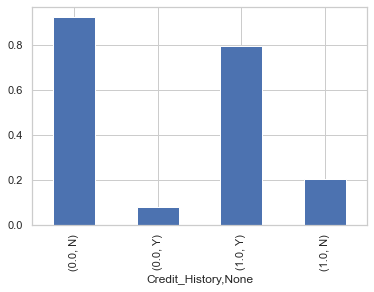

In [186]:
# check the correlation between the Credit_History and Loan_Status
print('\n\ncheck the correlation between the Credit_History and Loan_Status:\n')
print(df.groupby('Credit_History')['Loan_Status'].value_counts(normalize=True))

# plot the correlation between the Credit_History and Loan_Status
print('\n\nplot the correlation between the Credit_History and Loan_Status:\n')
_ = df.groupby('Credit_History')['Loan_Status'].value_counts(normalize=True).plot.bar()






### Distribution analysis

Study distribution of various variables. Plot the histogram of ApplicantIncome, try different number of bins.



In [8]:
### Distribution analysis

# Study distribution of various variables. Plot the histogram of ApplicantIncome, try different number of bins.
import numpy as np
import pandas as pd
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_notebook

# number of bins
n_bins = 50

# display the plots in the notebook
output_notebook()

# Drop rows with missing values
df = df.dropna()

# Create a list of histograms
histograms = []
for col in df.select_dtypes(include='number').columns:
    p = figure(title=col, background_fill_color="#fafafa", width=400, height=400)
    hist, edges = np.histogram(df[col], density=True, bins=n_bins)
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], fill_color="navy", line_color="white", alpha=0.5)
    histograms.append(p)

# Show the gridplot
show(gridplot(histograms, ncols=2, toolbar_location=None))


Loading BokehJS ...

GlyphRenderer(id='p1055', ...)

GlyphRenderer(id='p1115', ...)

GlyphRenderer(id='p1175', ...)

GlyphRenderer(id='p1235', ...)

GlyphRenderer(id='p1295', ...)


Look at box plots to understand the distributions. 

In [9]:
_num_columns = df.select_dtypes(include='number').columns
_num_columns
_cat_columns = df.select_dtypes(include='object').columns.drop('Loan_ID')
_cat_columns

# drop the column 'Credit_History' from _num_columns
_num_columns = _num_columns.drop('Credit_History')
_num_columns

# cat the two lists _num_columns and ['Credit_History']
_cat_columns = _cat_columns.append(pd.Index(['Credit_History']))
_cat_columns

Index(['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History'],
      dtype='object')

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Property_Area', 'Loan_Status'],
      dtype='object')

Index(['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term'],
      dtype='object')

Index(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'Property_Area', 'Loan_Status', 'Credit_History'],
      dtype='object')

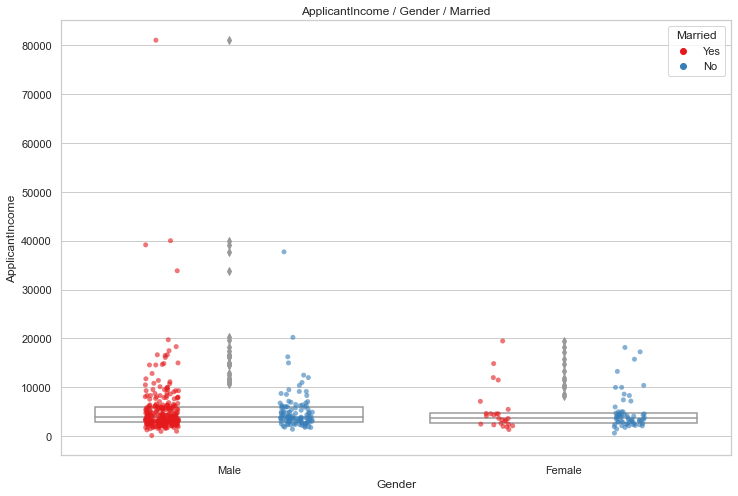

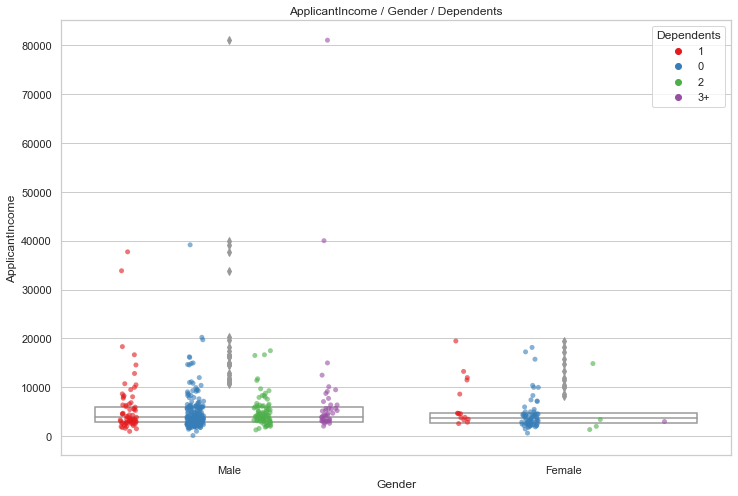

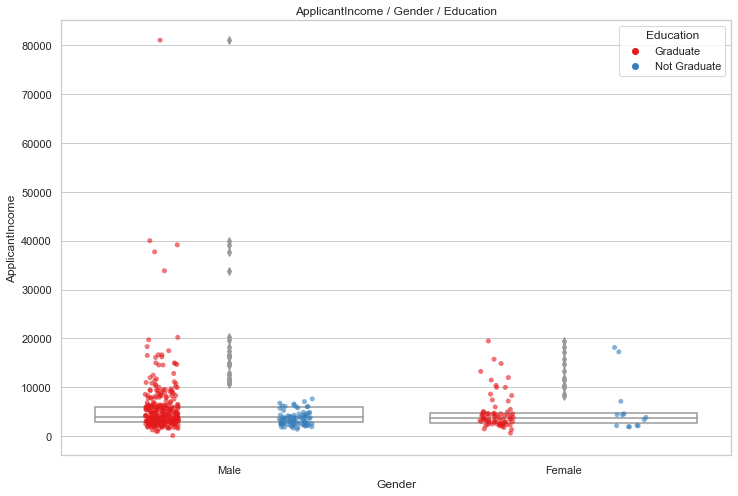

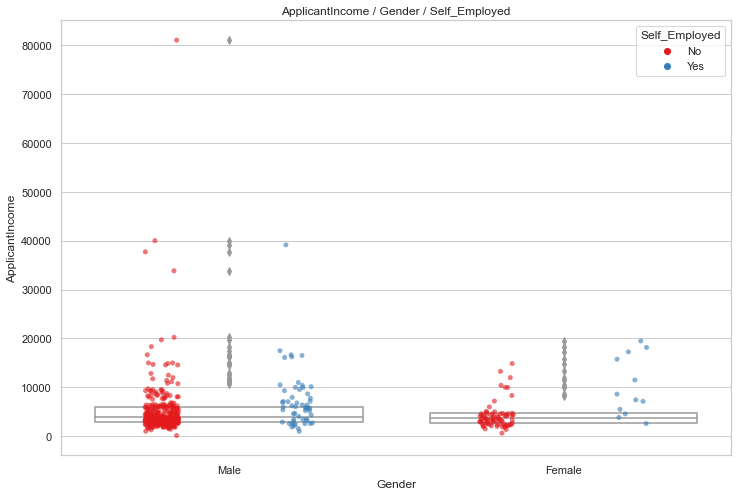

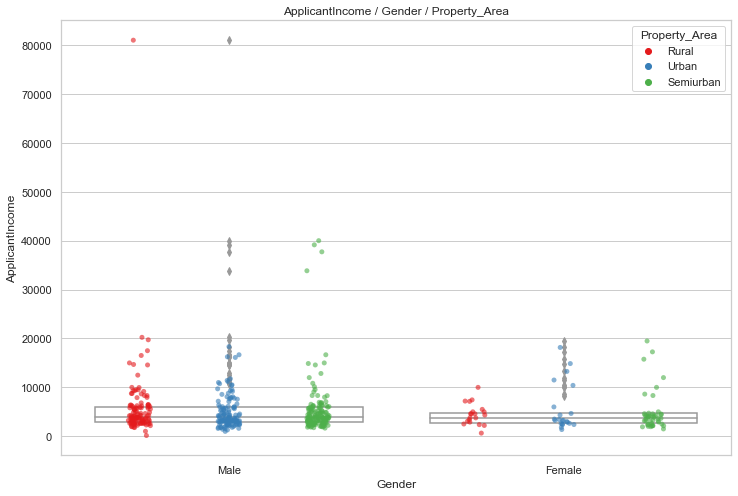

...

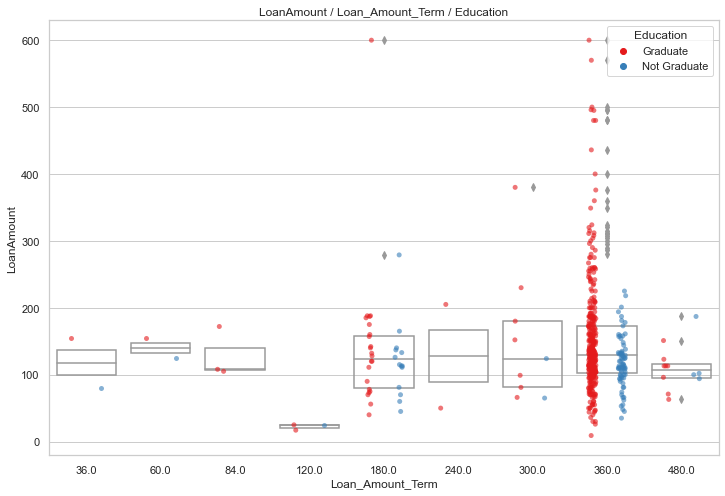

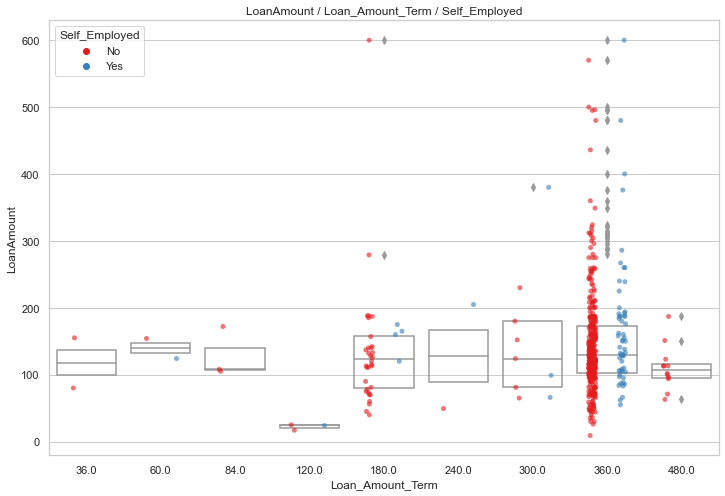

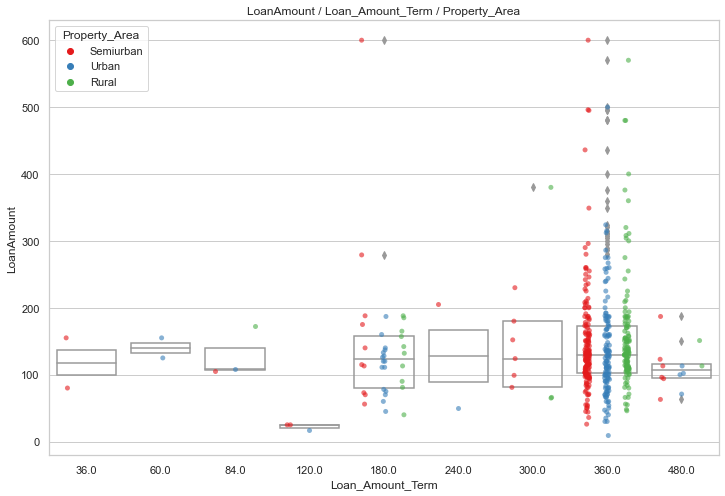

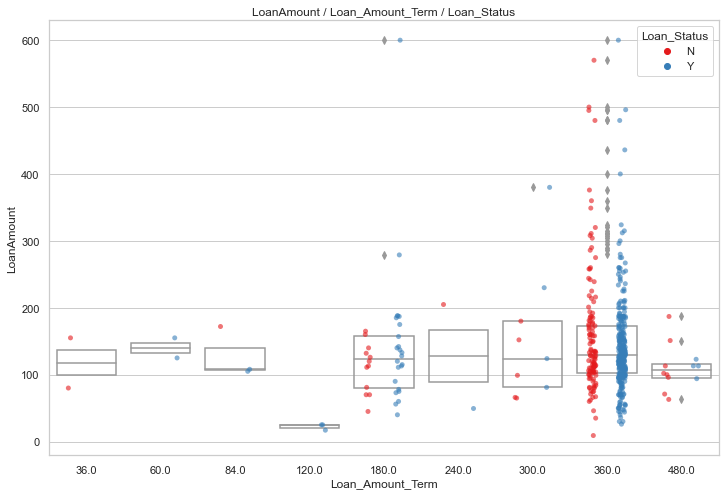

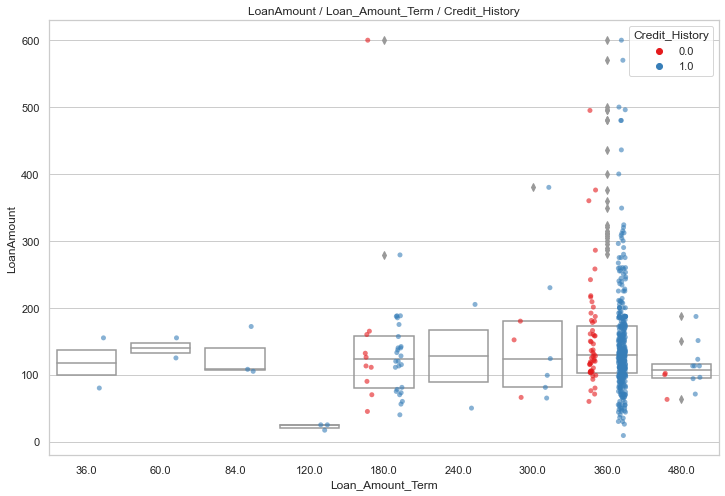

In [16]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Drop rows with missing values
# df = df.dropna()

# # Set up the Seaborn style
# sns.set(style="whitegrid")

# # Create a list of numerical columns
# num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
#        'Loan_Amount_Term']

# # Create a list of categorical columns (excluding Loan_ID as it's unique for each row)
# cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
#        'Property_Area', 'Loan_Status', 'Credit_History']

# # Iterate through the numerical and categorical columns and create box plots
# for num_col in num_columns:
#     for cat_col in cat_columns:
#         _ = plt.figure(figsize=(10, 6))
#         _ = sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set1')
#         _ = plt.title(f"Box plot of {num_col} grouped by {cat_col}")
#         _ = plt.show()



# import seaborn as sns
# import matplotlib.pyplot as plt

# # Drop rows with missing values
# df = df.dropna()

# # Set up the Seaborn style
# sns.set(style="whitegrid")

# num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
# cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term']

# # Iterate through the numerical and categorical columns and create box plots
# for num_col in num_columns:
#     for i, cat_col1 in enumerate(cat_columns[:-1]):
#         for cat_col2 in cat_columns[i+1:]:
#             _ = plt.figure(figsize=(10, 6))
#             _ = sns.boxplot(x=cat_col1, y=num_col, hue=cat_col2, data=df, palette='Set1')
#             _ = plt.title(f"Box plot of {num_col} grouped by {cat_col1} and colored by {cat_col2}")
#             _ = plt.legend(title=cat_col2)
#             _ = plt.show()


# import seaborn as sns
# import matplotlib.pyplot as plt

# # Drop rows with missing values
# df = df.dropna()

# # Set up the Seaborn style
# sns.set(style="whitegrid")

# num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
# cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term']

# # Choose a secondary categorical feature for coloring the dots
# color_by = 'Gender'

# # Iterate through the numerical and categorical columns and create box plots
# for num_col in num_columns:
#     for cat_col in cat_columns:
#         if cat_col == color_by:
#             continue  # Skip if the color_by feature is the same as the x-axis feature

#         _ = plt.figure(figsize=(12, 8))
#         _ = sns.boxplot(x=cat_col, y=num_col, data=df, color='white', showcaps=False, boxprops={'facecolor': 'none'}, whiskerprops={'linewidth': 0})
#         _ = sns.stripplot(x=cat_col, y=num_col, data=df, hue=color_by, jitter=True, dodge=True, palette='Set1', alpha=0.6)
#         _ = plt.title(f"{num_col} / {cat_col} / {color_by}")
#         # save to png
#         _ = plt.savefig('../images/' + f"{num_col}_{cat_col}_{color_by}.png", dpi=300, bbox_inches='tight', edgecolor='white')
#         _ = plt.show()


import seaborn as sns
import matplotlib.pyplot as plt

# Drop rows with missing values
df = df.dropna()

# Set up the Seaborn style
sns.set(style="whitegrid")

num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term']

# Choose a secondary categorical feature for coloring the dots
color_by_collumns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term'] # 'Gender'

# Iterate through the numerical and categorical columns and create box plots
for num_col in num_columns:
    for cat_col in cat_columns:
        for color_by in color_by_collumns:
            if cat_col == color_by:
                continue  # Skip if the color_by feature is the same as the x-axis feature

            _ = plt.figure(figsize=(12, 8))
            _ = sns.boxplot(x=cat_col, y=num_col, data=df, color='white', showcaps=False, boxprops={'facecolor': 'none'}, whiskerprops={'linewidth': 0})
            _ = sns.stripplot(x=cat_col, y=num_col, data=df, hue=color_by, jitter=True, dodge=True, palette='Set1', alpha=0.6)
            _ = plt.title(f"{num_col} / {cat_col} / {color_by}")
            # save to png
            _ = plt.savefig('../images/' + f"{num_col}_{cat_col}_{color_by}.png", dpi=300, bbox_inches='tight', edgecolor='white')
            _ = plt.show()

### Further EDA:

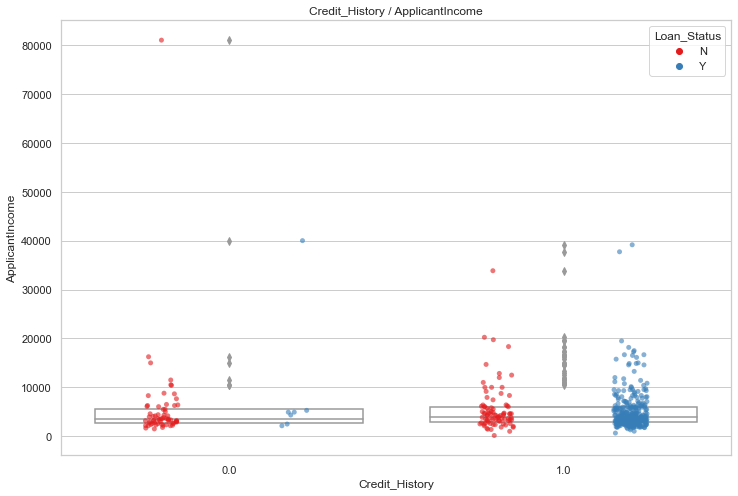

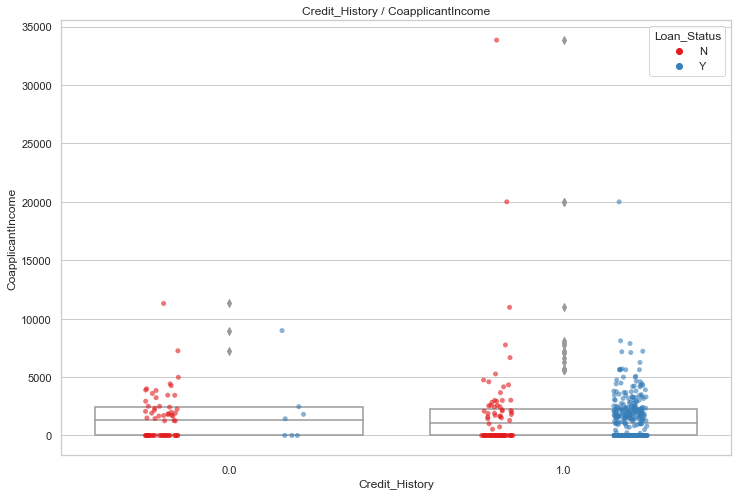

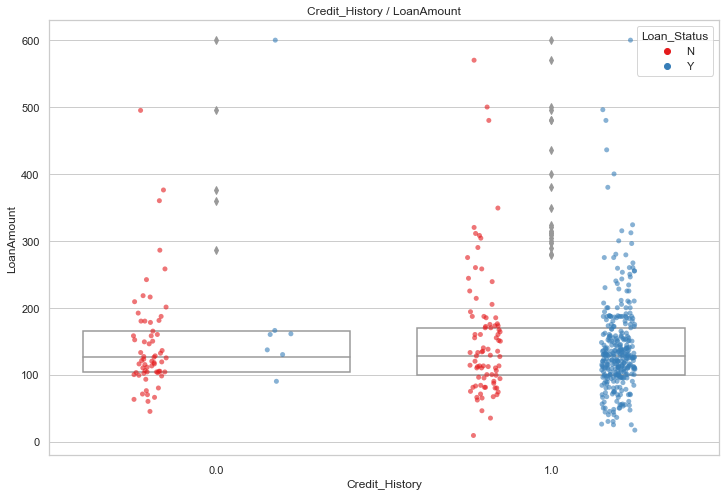

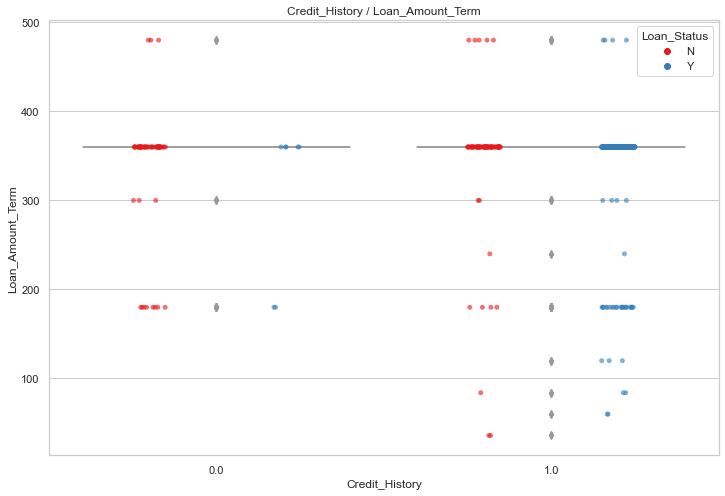

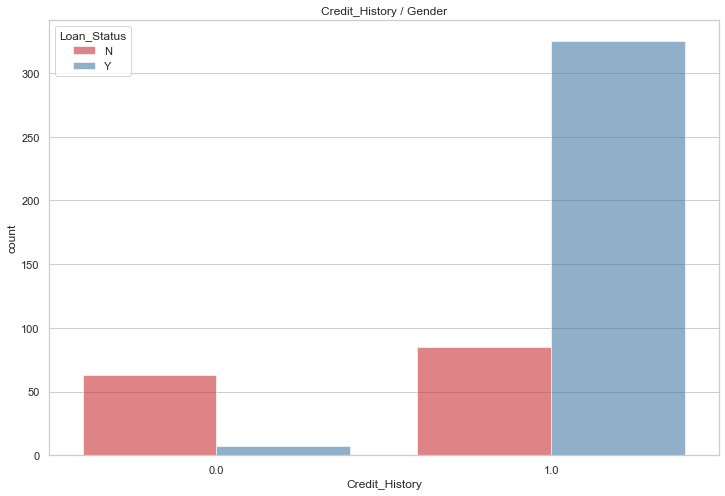

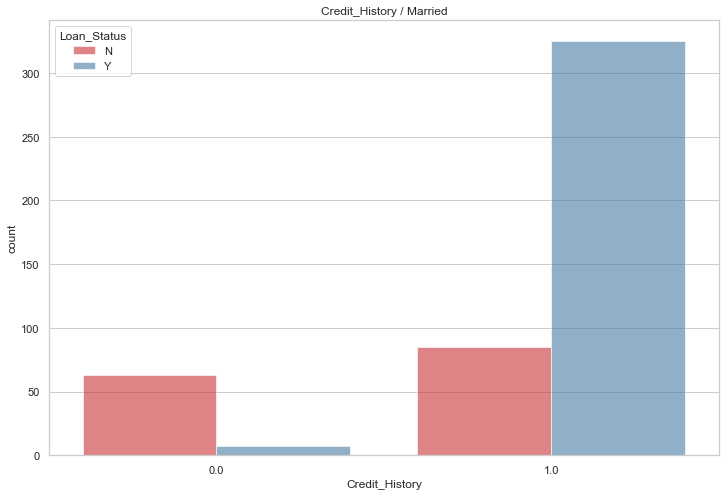

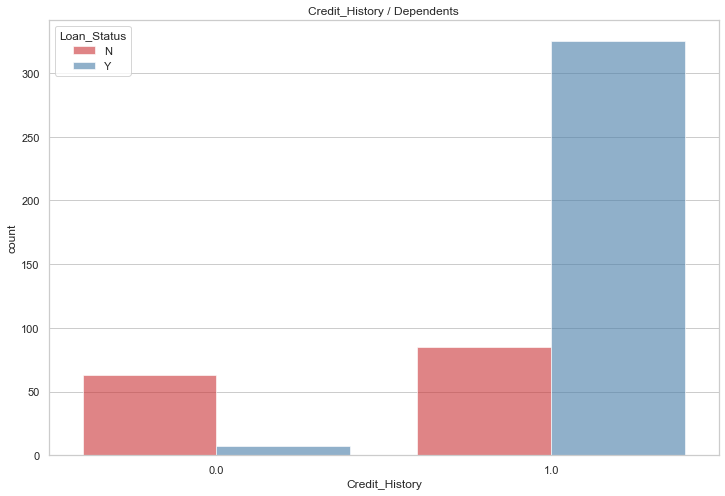

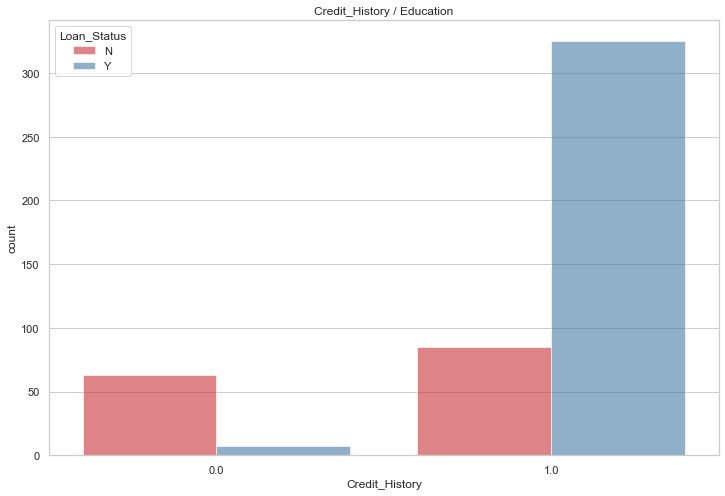

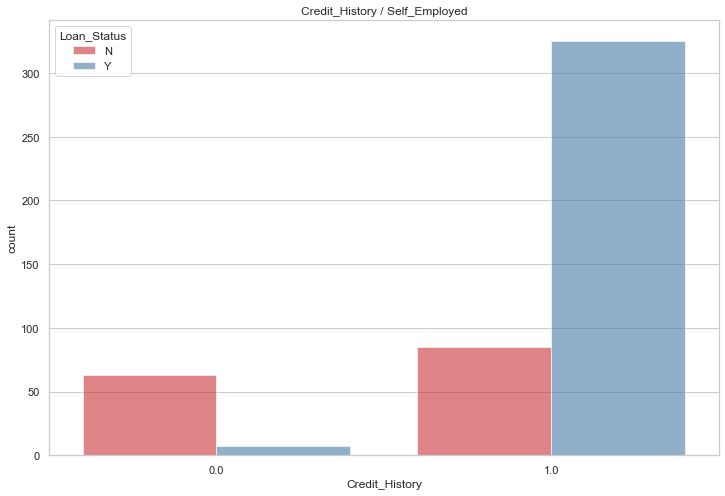

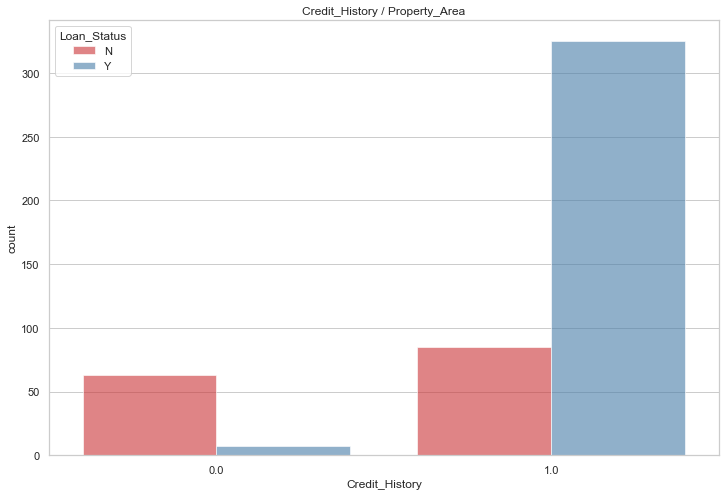

In [190]:
df = pd.read_csv('../data/data.csv')
import seaborn as sns
import matplotlib.pyplot as plt

# Drop rows with missing values
df = df.dropna()

# Set up the Seaborn style
sns.set(style="whitegrid")

num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term']
cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area']

# Iterate through the numerical and categorical columns and create plots
for col_type in ['num', 'cat']:
    for col in (num_columns if col_type == 'num' else cat_columns):
        # Set the x-axis feature to 'Credit_History'
        x_col = 'Credit_History'

        # Set the hue to 'Loan_Status'
        hue_col = 'Loan_Status'

        _ = plt.figure(figsize=(12, 8))
        
        if col_type == 'num':
            _ = sns.boxplot(x=x_col, y=col, data=df, color='white', showcaps=False, boxprops={'facecolor': 'none'}, whiskerprops={'linewidth': 0})
            _ = sns.stripplot(x=x_col, y=col, data=df, hue=hue_col, jitter=True, dodge=True, palette='Set1', alpha=0.6)
        else:
            _ = sns.countplot(x=x_col, hue=hue_col, data=df, palette='Set1', alpha=0.6)
        
        _ = plt.title(f"Credit_History / {col}")
        
        # Save to png
        _ = plt.savefig('../images/' + f"Credit_History_{col}.png", dpi=300, bbox_inches='tight', edgecolor='white')
        _ = plt.show()


In [20]:
# import pandas as pd
# from bokeh.io import show, output_notebook
# from bokeh.models import ColumnDataSource, BoxAnnotation
# from bokeh.palettes import Category10
# from bokeh.plotting import figure
# from bokeh.transform import factor_cmap

# # Set up Bokeh output to display in the notebook
# output_notebook()

# num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
# cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term']

# # Choose a secondary categorical feature for coloring the dots
# color_by = 'Gender'

# # Function to create box plots using Bokeh
# def create_bokeh_box_plot(df, num_col, cat_col, color_by):
#     # Create a ColumnDataSource from the DataFrame
#     source = ColumnDataSource(df)

#     # Get unique categories and colors for the dots
#     unique_cat = sorted(df[cat_col].unique())
#     unique_color_by = sorted(df[color_by].unique())
#     palette = Category10[len(unique_color_by)] if len(unique_color_by) > 2 else Category10[3][:2]
#     color_map = factor_cmap(color_by, palette=palette, factors=unique_color_by)

#     # Create a Bokeh figure
#     p = figure(x_range=unique_cat, title=f"Box plot of {num_col} grouped by {cat_col} and colored by {color_by}", width=900, height=600)
    
#     # Add box plots
#     for i, cat in enumerate(unique_cat):
#         sub_df = df[df[cat_col] == cat]
#         q1 = sub_df[num_col].quantile(0.25)
#         q2 = sub_df[num_col].quantile(0.5)
#         q3 = sub_df[num_col].quantile(0.75)
#         iqr = q3 - q1
#         upper = q3 + 1.5 * iqr
#         lower = q1 - 1.5 * iqr

#         box = BoxAnnotation(left=i - 0.25, right=i + 0.25, bottom=lower, top=upper, fill_alpha=0.1, fill_color='gray', line_color='black')
#         p.add_layout(box)

#         p.segment(x0=[i], x1=[i], y0=[lower], y1=[q1], line_color='black', line_width=1)
#         p.segment(x0=[i], x1=[i], y0=[upper], y1=[q3], line_color='black', line_width=1)

#         p.vbar(x=i, width=0.5, bottom=q1, top=q3, fill_color='white', line_color='black', line_width=1)
#         p.vbar(x=i, width=0.5, bottom=q2, top=q2, fill_color='black', line_color='black', line_width=1)


#     # Add dots
#     p.scatter(x=cat_col, y=num_col, source=source, color=color_map, legend_field=color_by, alpha=0.6)

#     # Customize plot appearance
#     p.xgrid.grid_line_color = None
#     p.xaxis.axis_label = cat_col
#     p.yaxis.axis_label = num_col

#     # Customize plot appearance
#     p.xgrid.grid_line_color = None
#     p.xaxis.axis_label = cat_col
#     p.yaxis.axis_label = num_col
#     p.legend.location = "top_right"

#     return p

# # Iterate through the numerical and categorical columns and create box plots
# for num_col in num_columns:
#     for cat_col in cat_columns:
#         if cat_col != color_by:
#             # Create the box plot
#             p = create_bokeh_box_plot(df, num_col, cat_col, color_by)
#             # Show the plot
#             show(p)



Look at the distribution of income segregated  by `Education`

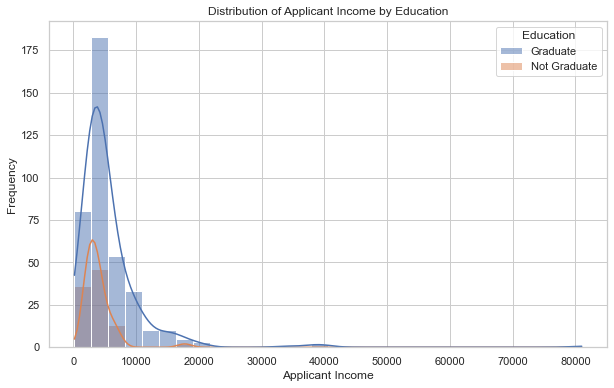

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the Seaborn style
sns.set(style="whitegrid")

# Create a histogram to visualize the distribution of income segregated by Education
_ = plt.figure(figsize=(10, 6))
_ = sns.histplot(data=df, x='ApplicantIncome', hue='Education', kde=True, bins=30)
_ = plt.title("Distribution of Applicant Income by Education")
_ = plt.xlabel("Applicant Income")
_ = plt.ylabel("Frequency")
_ = plt.show()


Look at the histogram and boxplot of LoanAmount

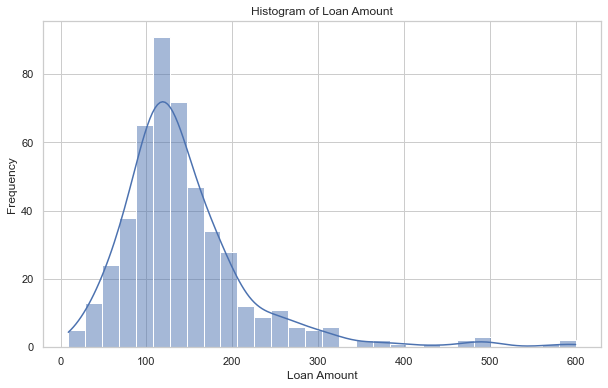

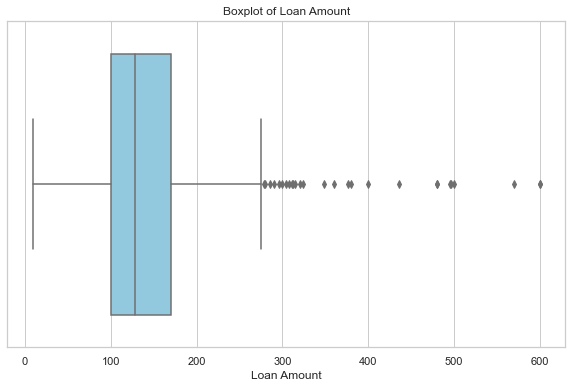

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the Seaborn style
sns.set(style="whitegrid")

# Create a histogram to visualize the distribution of LoanAmount
_ = plt.figure(figsize=(10, 6))
_ = sns.histplot(data=df, x='LoanAmount', kde=True, bins=30)
_ = plt.title("Histogram of Loan Amount")
_ = plt.xlabel("Loan Amount")
_ = plt.ylabel("Frequency")
_ = plt.show()

# Create a boxplot to visualize the distribution of LoanAmount
_ = plt.figure(figsize=(10, 6))
_ = sns.boxplot(data=df, x='LoanAmount', color='skyblue')
_ = plt.title("Boxplot of Loan Amount")
_ = plt.xlabel("Loan Amount")
_ = plt.show()


There might be some extreme values. Both `ApplicantIncome` and `LoanAmount` require some amount of data munging. `LoanAmount` has missing and well as extreme values values, while `ApplicantIncome` has a few extreme values, which demand deeper understanding. 

### Categorical variable analysis

Try to understand categorical variables in more details using `pandas.DataFrame.pivot_table` and some visualizations.

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Married')

Text(0, 0.5, 'Count')

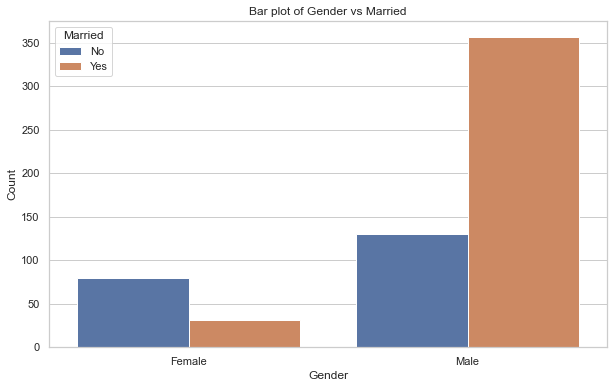

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Dependents')

Text(0, 0.5, 'Count')

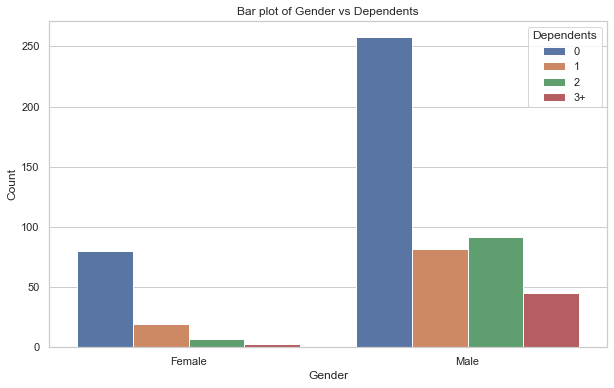

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Education')

Text(0, 0.5, 'Count')

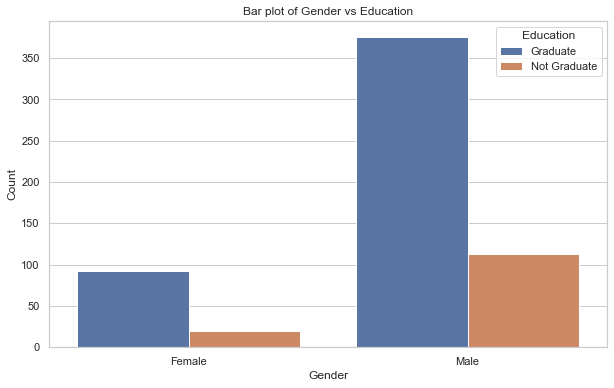

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Self_Employed')

Text(0, 0.5, 'Count')

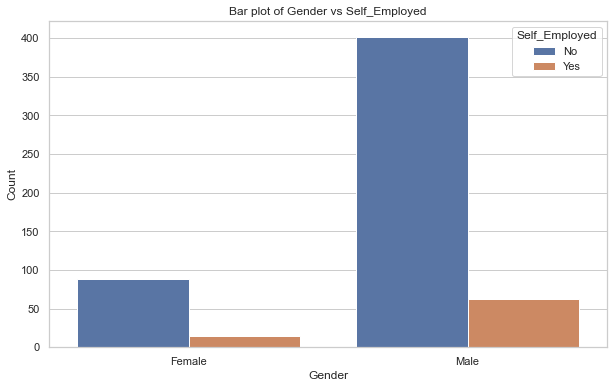

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Property_Area')

Text(0, 0.5, 'Count')

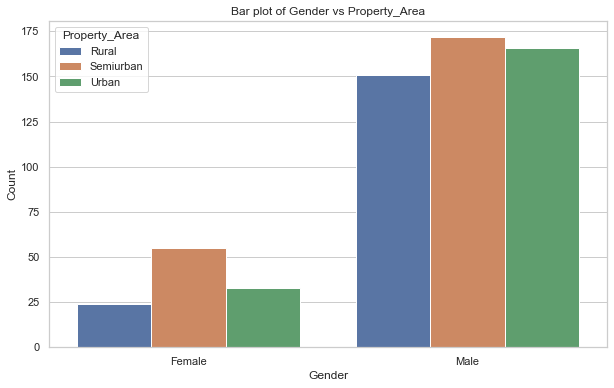

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Loan_Status')

Text(0, 0.5, 'Count')

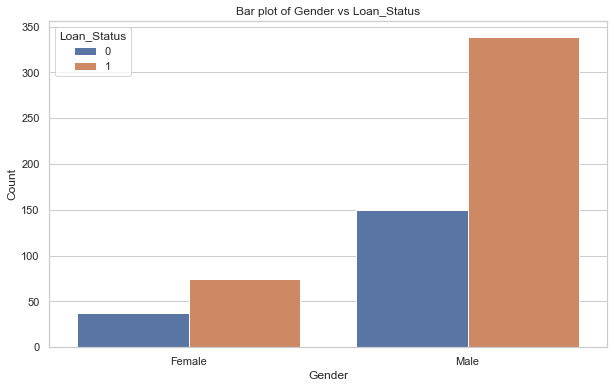

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Gender', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Gender vs Credit_History')

Text(0, 0.5, 'Count')

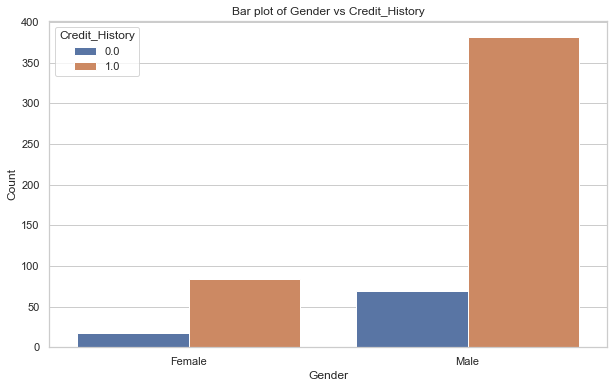

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Dependents')

Text(0, 0.5, 'Count')

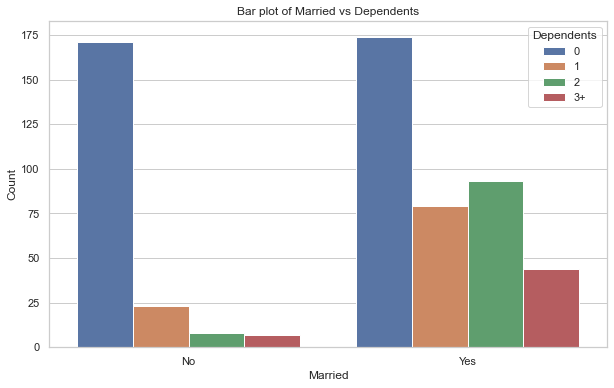

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Education')

Text(0, 0.5, 'Count')

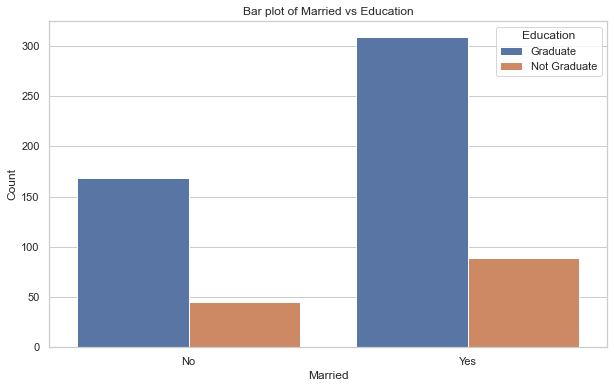

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Self_Employed')

Text(0, 0.5, 'Count')

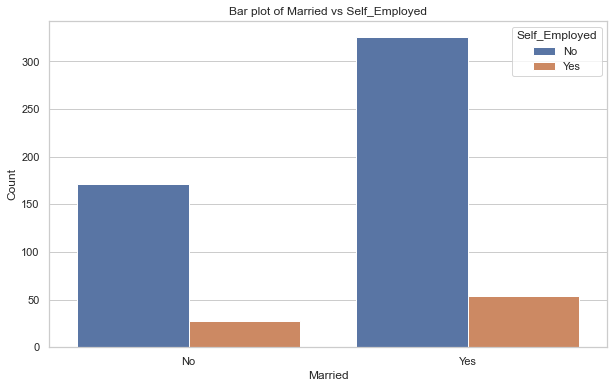

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Property_Area')

Text(0, 0.5, 'Count')

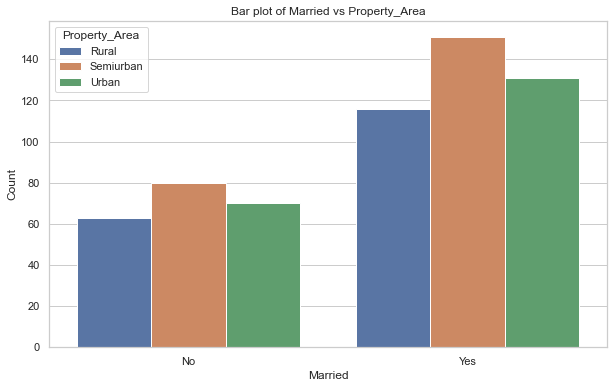

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Loan_Status')

Text(0, 0.5, 'Count')

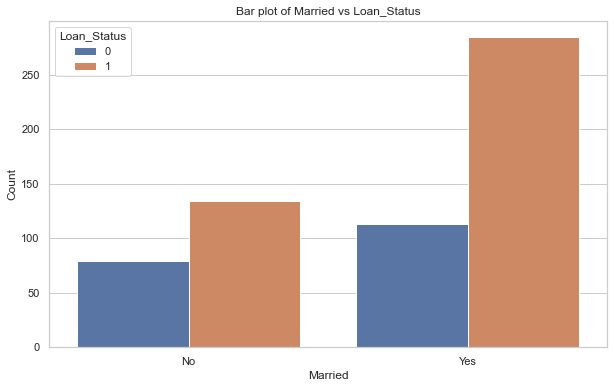

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Married', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Married vs Credit_History')

Text(0, 0.5, 'Count')

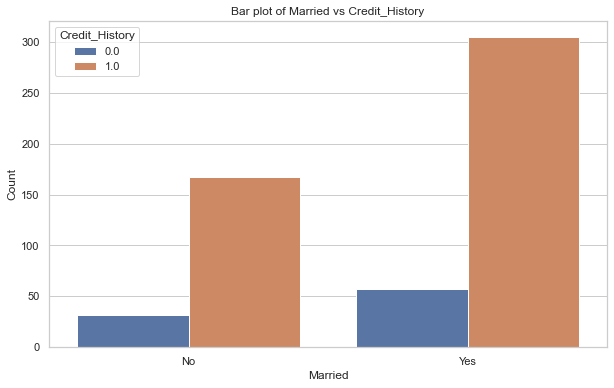

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Dependents', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Dependents vs Education')

Text(0, 0.5, 'Count')

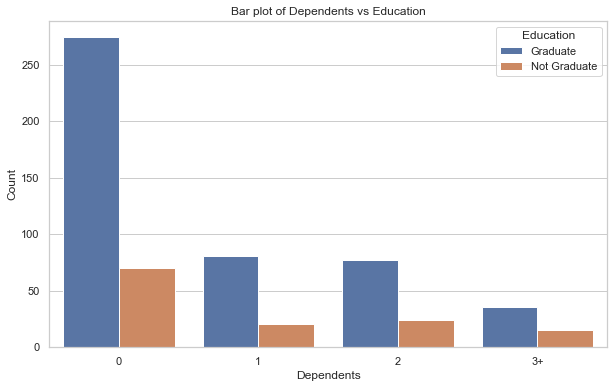

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Dependents', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Dependents vs Self_Employed')

Text(0, 0.5, 'Count')

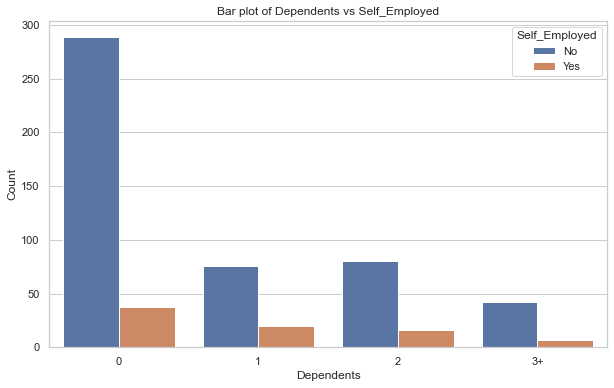

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Dependents', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Dependents vs Property_Area')

Text(0, 0.5, 'Count')

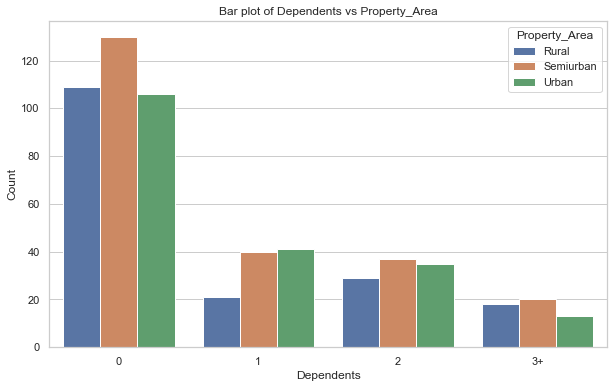

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Dependents', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Dependents vs Loan_Status')

Text(0, 0.5, 'Count')

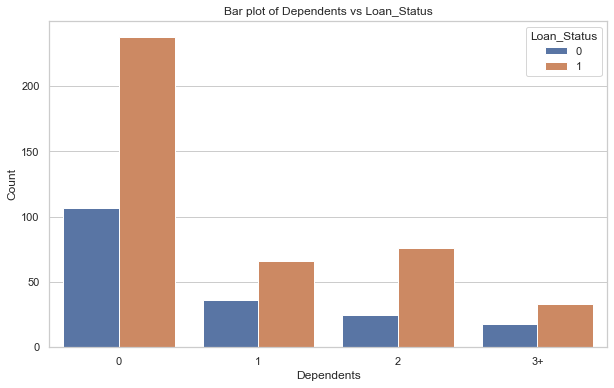

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Dependents', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Dependents vs Credit_History')

Text(0, 0.5, 'Count')

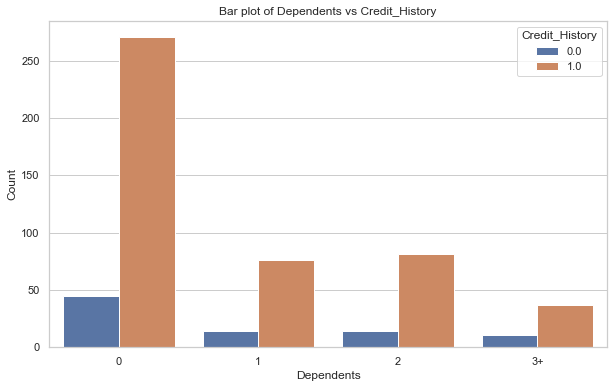

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Education', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Education vs Self_Employed')

Text(0, 0.5, 'Count')

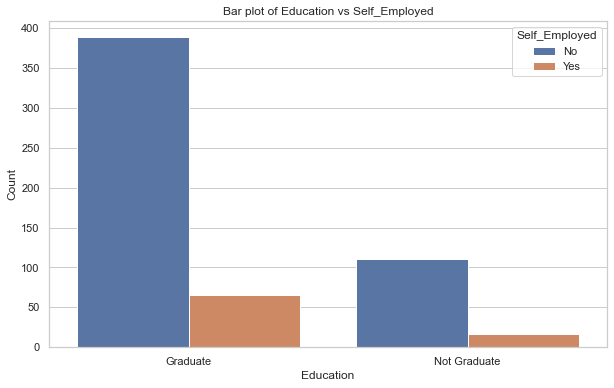

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Education', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Education vs Property_Area')

Text(0, 0.5, 'Count')

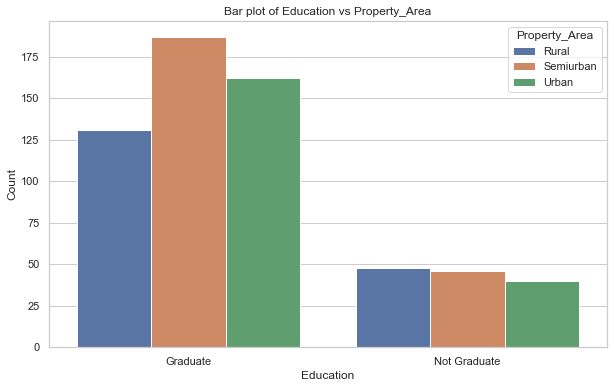

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Education', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Education vs Loan_Status')

Text(0, 0.5, 'Count')

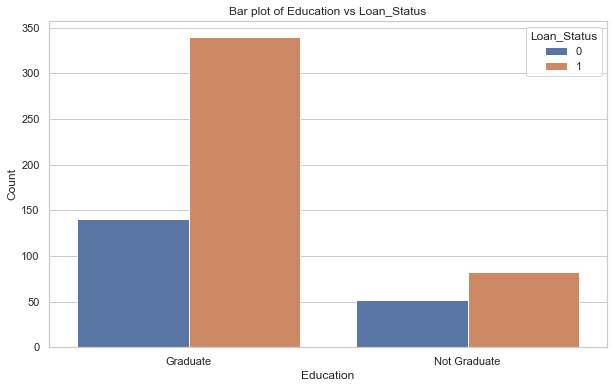

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Education', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Education vs Credit_History')

Text(0, 0.5, 'Count')

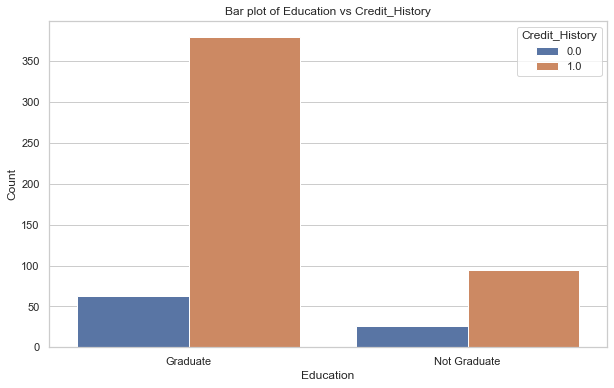

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Self_Employed', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Self_Employed vs Property_Area')

Text(0, 0.5, 'Count')

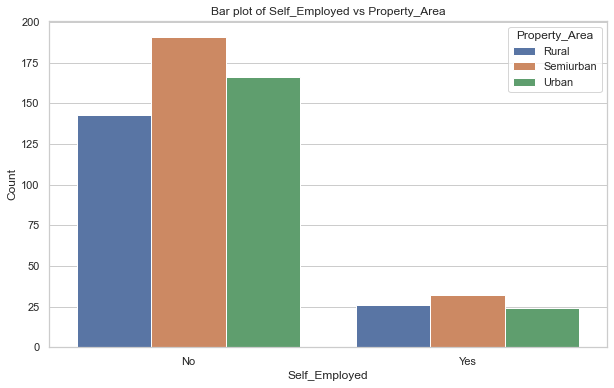

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Self_Employed', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Self_Employed vs Loan_Status')

Text(0, 0.5, 'Count')

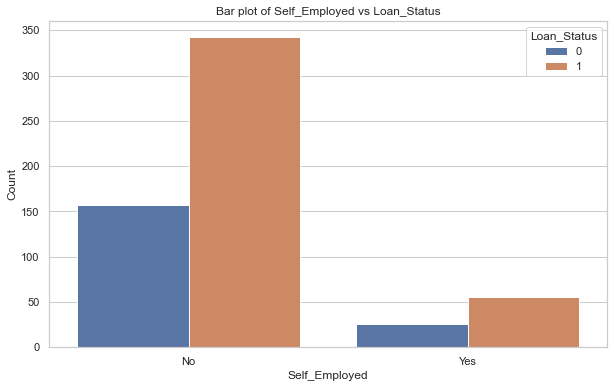

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Self_Employed', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Self_Employed vs Credit_History')

Text(0, 0.5, 'Count')

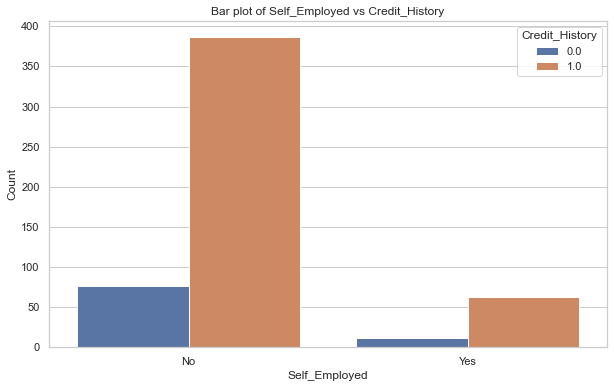

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Property_Area', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Property_Area vs Loan_Status')

Text(0, 0.5, 'Count')

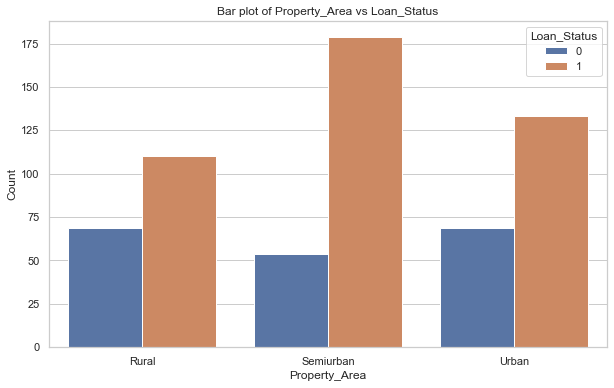

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Property_Area', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Property_Area vs Credit_History')

Text(0, 0.5, 'Count')

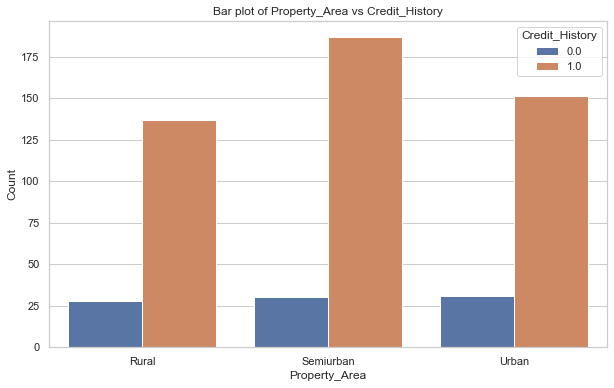

<Figure size 720x432 with 0 Axes>

<AxesSubplot:xlabel='Loan_Status', ylabel='Count'>

Text(0.5, 1.0, 'Bar plot of Loan_Status vs Credit_History')

Text(0, 0.5, 'Count')

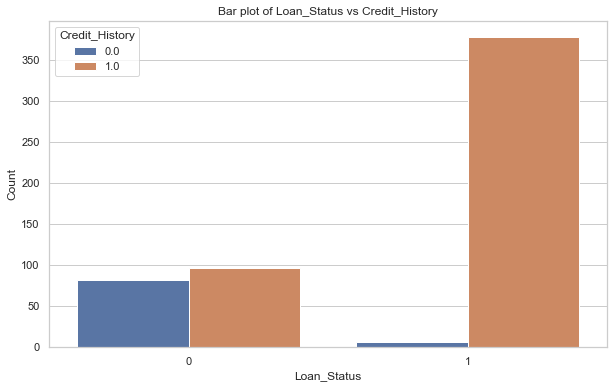

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the Seaborn style
sns.set(style="whitegrid")

# Create a list of categorical columns (excluding Loan_ID as it's unique for each row)
cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History']

# Iterate through the categorical columns and create pivot tables and bar plots
for i, col1 in enumerate(cat_columns[:-1]):
    for col2 in cat_columns[i + 1:]:
        # Create a pivot table
        pivot_table = pd.pivot_table(df, index=col1, columns=col2, values='Loan_ID', aggfunc='count')
        
        # Reset the index to use the columns in the bar plot
        pivot_table = pivot_table.reset_index().melt(id_vars=col1, var_name=col2, value_name='Count')
        
        # Create a bar plot
        plt.figure(figsize=(10, 6))
        sns.barplot(data=pivot_table, x=col1, hue=col2, y='Count')
        plt.title(f"Bar plot of {col1} vs {col2}")
        plt.ylabel("Count")
        plt.show()


# import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Function to create a custom barplot
# def custom_barplot(df, num_col, cat_col):
#     # Drop missing values
#     df_clean = df[[num_col, cat_col]].dropna()

#     # Calculate the aggregated statistics
#     agg_func = {'mean': np.mean, 'median': np.median, 'min': np.min, 'max': np.max, 'std': np.std}
#     pivot = df_clean.pivot_table(index=cat_col, values=num_col, aggfunc=agg_func)

#     # Calculate the interquartile range
#     pivot['iqr'] = df_clean.groupby(cat_col)[num_col].quantile(0.75) - df_clean.groupby(cat_col)[num_col].quantile(0.25)

#     # Melt the pivot table to a long format
#     pivot_long = pd.melt(pivot.reset_index(), id_vars=cat_col, value_vars=list(agg_func.keys()) + ['iqr'])

#     # Remove rows with NaN values from the aggregated statistics
#     pivot_long = pivot_long.dropna()

#     # Plot the barplot with error bars
#     plt.figure(figsize=(10, 6))
#     sns.barplot(x=cat_col, y='value', hue='variable', data=pivot_long, palette='Set1', capsize=0.1, errwidth=1.5)
#     plt.title(f"{num_col} Statistics Grouped by {cat_col}")
#     plt.ylabel(num_col)
#     plt.legend(title="Statistics")
#     plt.show()



# # Iterate through the numerical and categorical columns and create bar plots
# num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
# cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Loan_Status', 'Credit_History', 'Loan_Amount_Term']

# for num_col in num_columns:
#     for cat_col in cat_columns:
#         custom_barplot(df, num_col, cat_col)



## 3. Data Cleaning

This step typically involves imputing missing values and treating outliers. 

### Imputing Missing Values

Missing values may not always be NaNs. For instance, the `Loan_Amount_Term` might be 0, which does not make sense.



Impute missing values for all columns. Use the values which you find most meaningful (mean, mode, median, zero.... maybe different mean values for different groups)

In [ ]:
# ## 3. Data Cleaning

# # Impute missing values
# df['Gender'].fillna(df['Gender'].mode()[0], inplace=True)
# df['Married'].fillna(df['Married'].mode()[0], inplace=True)
# df['Dependents'].fillna(df['Dependents'].mode()[0], inplace=True)
# df['Self_Employed'].fillna(df['Self_Employed'].mode()[0], inplace=True)
# df['LoanAmount'].fillna(df['LoanAmount'].median(), inplace=True)
# df['Loan_Amount_Term'].fillna(df['Loan_Amount_Term'].mode()[0], inplace=True)
# df['Credit_History'].fillna(df['Credit_History'].mode()[0], inplace=True)

# # Log transformation of LoanAmount and TotalIncome
# df['LoanAmount'] = np.log(df['LoanAmount'])
# df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
# df['TotalIncome'] = np.log(df['TotalIncome'])



### Extreme values
Try a log transformation to get rid of the extreme values in `LoanAmount`. Plot the histogram before and after the transformation

Combine both incomes as total income and take a log transformation of the same.

## 4. Building a Predictive Model

In [ ]:
df.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area', 'Loan_Status'],
      dtype='object')

In [ ]:
df_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    object 
 10  Credit_History     564 non-null    object 
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    int64  
dtypes: float64(2), int64(2), object(9)
memory usage: 62.5+ KB


In [ ]:
df_m[num_columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ApplicantIncome    614 non-null    int64  
 1   CoapplicantIncome  614 non-null    float64
 2   LoanAmount         592 non-null    float64
 3   Loan_Amount_Term   600 non-null    object 
dtypes: float64(2), int64(1), object(1)
memory usage: 19.3+ KB


### Basic Model:


In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
# from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
import pickle


# Preprocessing and train-test split
le = LabelEncoder()
df['Loan_Status'] = le.fit_transform(df['Loan_Status'])
X = df.drop(['Loan_ID', 'Loan_Status'], axis=1)
y = df['Loan_Status']

# Encode categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns
for column in categorical_columns:
    X[column] = le.fit_transform(X[column].astype(str))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = HistGradientBoostingClassifier(random_state=42)
model.fit(X_train, y_train)

# Save the model
with open('hist_gradient_boosting_model.pkl', 'wb') as f:
    pickle.dump(model, f)

# Save a test dataset for testing deployment
test_data = X_test.head(10).reset_index(drop=True)
test_data.to_csv('test_data.csv', index=False)


HistGradientBoostingClassifier(random_state=42)

In [19]:
df.head(10)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,0
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,1
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,1
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,1
5,LP001011,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,1
6,LP001013,Male,Yes,0,Not Graduate,No,2333,1516.0,95.0,360.0,1.0,Urban,1
7,LP001014,Male,Yes,3+,Graduate,No,3036,2504.0,158.0,360.0,0.0,Semiurban,0
8,LP001018,Male,Yes,2,Graduate,No,4006,1526.0,168.0,360.0,1.0,Urban,1
9,LP001020,Male,Yes,1,Graduate,No,12841,10968.0,349.0,360.0,1.0,Semiurban,0
10,LP001024,Male,Yes,2,Graduate,No,3200,700.0,70.0,360.0,1.0,Urban,1


### Advanced Model:

In [58]:
df['Loan_Status'].unique()

['Y', 'N']
Categories (2, object): ['N', 'Y']

Text(0.5, 1.02, 'Histogram of TotalIncome, LoanAmount (Before Log Transforming)')

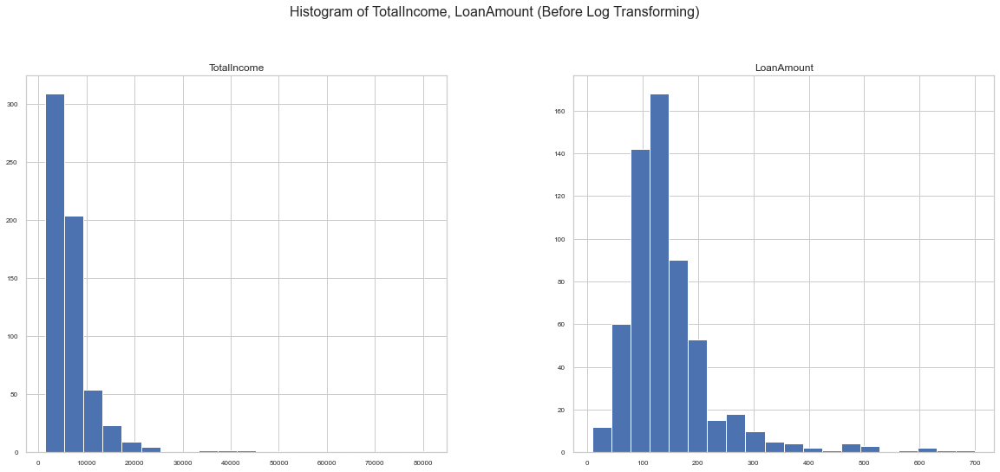

In [156]:
df = pd.read_csv('../data/data.csv')
df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
# plot df's 3 columns: ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount'] to check whether they are normally distributed
num_columns__ = ['TotalIncome', 'LoanAmount']
_ = df[num_columns__].hist(figsize=(20, 8), bins=20, xlabelsize=8, ylabelsize=8)
# set the title of the figure
plt.suptitle('Histogram of TotalIncome, LoanAmount (Before Log Transforming)', fontsize=16, y=1.02)
# save the figure as png, dpi=300
plt.savefig('../images/histogram_before_log_transform.png', dpi=300, bbox_inches='tight', pad_inches=0.2, transparent=False)


Text(0.5, 1.02, 'Histogram of TotalIncome, LoanAmount (After Log Transforming)')

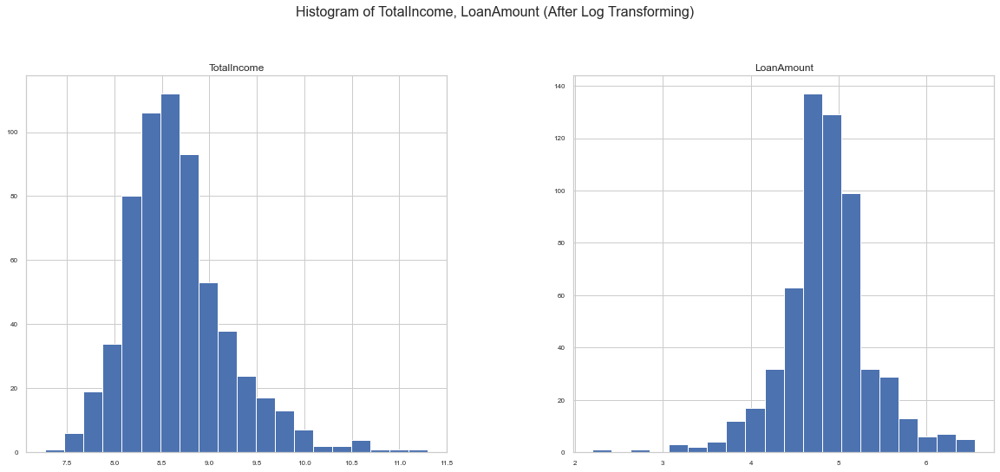

In [157]:

# apply np.log to df's 3 columns: ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount'] to make them normally distributed
df['LoanAmount'] = np.log(df['LoanAmount'])
df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
df['TotalIncome'] = np.log(df['TotalIncome'])

num_columns__ = ['TotalIncome', 'LoanAmount']
_ = df[num_columns__].hist(figsize=(20, 8), bins=20, xlabelsize=8, ylabelsize=8)
plt.suptitle('Histogram of TotalIncome, LoanAmount (After Log Transforming)', fontsize=16, y=1.02)

# save the figure as png, dpi=300
plt.savefig('../images/histogram_after_log_transform.png', dpi=300, bbox_inches='tight', pad_inches=0.2, transparent=False)


V2

In [181]:
def feature_engineering(df, is_train=True):
    # Convert data types
    num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
    cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Credit_History', 'Loan_Amount_Term']
    if is_train:
        cat_columns.append('Loan_Status')
    
    df[num_columns] = df[num_columns].astype(float)
    df[cat_columns] = df[cat_columns].astype('category')
    
    df['LoanAmount'] = df['LoanAmount'] * 1000
    df['LoanAmount'] = np.log(df['LoanAmount'])
    
    if is_train:
        df['Loan_Status_number'] = df['Loan_Status'].map({'Y': 1, 'N': 0}).astype(int)

    temp_married_series = df['Married'].map({'Yes': 2, 'No': 1}).astype('Int64')
    df['Married_number'] = temp_married_series.fillna(1).astype(int)
    
    df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
    df['TotalIncome'] = np.log(df['TotalIncome'])    
    temp_dependents_series = df['Dependents'].map({'0': 0, '1': 1, '2': 2, '3+': 3}).astype('Int64')
    df['Dependents_number'] = temp_dependents_series.fillna(0).astype(int)
    df['family_size'] = df['Dependents_number'] + df['Married_number']
    
    df['income_per_person'] = df['TotalIncome'] / df['family_size']
    df['income_share'] = df['CoapplicantIncome'] / df['ApplicantIncome']
    df['LoanAmount_monthly'] = df['LoanAmount'] / df['Loan_Amount_Term'].astype(float) 
    df['LoanAmount_monthly_to_income'] = df['LoanAmount_monthly'] / df['TotalIncome']
    df['LoanAmount_monthly_per_person'] = df['LoanAmount_monthly'] / df['family_size']

    if is_train:
        global lookup_tables
        lookup_tables = {}
        for column in cat_columns:
            if column != 'Loan_Status':
                lookup_tables[column] = df.groupby(column)['Loan_Status_number'].agg(['mean', 'count']).reset_index()
                lookup_tables[column].columns = [column, f'{column}_mean', f'{column}_count']
    
    for column in cat_columns:
        if column != 'Loan_Status':
            df = df.merge(lookup_tables[column], on=column, how='left')
            df = df.drop(column, axis=1)

    if 'Loan_ID' in df.columns:
        df = df.drop('Loan_ID', axis=1)


    if is_train:
        df.drop('Loan_Status_number', axis=1, inplace=True)
    
    df.drop('Dependents_number', axis=1, inplace=True)
    df.drop('Married_number', axis=1, inplace=True)
    
    if is_train:
        return df, lookup_tables
    else:
        return df
    
# Use the function for the train dataset
df = pd.read_csv('../data/data.csv')
df_m, lookup_tables = feature_engineering(df, is_train=True)

# Save the lookup_tables to a binary file
with open('lookup_tables.pkl', 'wb') as f:
    pickle.dump(lookup_tables, f)

new version:

In [131]:
# # Use the function for the train dataset
# df = pd.read_csv('../data/data.csv')
# df_m, lookup_tables = feature_engineering(df, is_train=True)

# # Save the lookup_tables to a binary file
# with open('lookup_tables.pkl', 'wb') as f:
#     pickle.dump(lookup_tables, f)

V1

In [78]:
lookup_tables

{'Gender':    Gender  Gender_mean  Gender_count
 0  Female     0.669643           112
 1    Male     0.693252           489,
 'Married':   Married  Married_mean  Married_count
 0      No      0.629108            213
 1     Yes      0.716080            398,
 'Dependents':   Dependents  Dependents_mean  Dependents_count
 0          0         0.689855               345
 1          1         0.647059               102
 2          2         0.752475               101
 3         3+         0.647059                51,
 'Education':       Education  Education_mean  Education_count
 0      Graduate        0.708333              480
 1  Not Graduate        0.611940              134,
 'Self_Employed':   Self_Employed  Self_Employed_mean  Self_Employed_count
 0            No            0.686000                  500
 1           Yes            0.682927                   82,
 'Property_Area':   Property_Area  Property_Area_mean  Property_Area_count
 0         Rural            0.614525                

In [106]:
# # df.head(10)
# # show the df['dependents'] == NaN rows:
# df[df['Dependents'].isnull()]

In [107]:
# df_m.head(10)
# df_m.shape
# df_m.info()


In [108]:

# # show the df_m['Loan_ID'] == 'LP001426' rows:
# df_m[df_m['Loan_ID'] == 'LP001426']

#### Training the model:

In [182]:
df = pd.read_csv('../data/data.csv')
import numpy as np
import pandas as pd
import pickle
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, PowerTransformer
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, classification_report

# Load the lookup_tables
with open('lookup_tables.pkl', 'rb') as f:
    lookup_tables = pickle.load(f)

# Pre-process the data
df_train, _ = feature_engineering(df, is_train=True)

X_train = df_train.drop('Loan_Status', axis=1)
y_train = df_train['Loan_Status'].replace({'N': 0, 'Y': 1})  # Convert 'N' and 'Y' to 0 and 1

# Define the different scalers
scalers = {
    'none': 'passthrough',
    'standard': StandardScaler(),
    'normalizer': Normalizer(),
    'minmax': MinMaxScaler(),
    'power': PowerTransformer()
}

# Define the models and their specific hyperparameters for grid search
models = {
    'hist_gradient_boosting': {
        'model': HistGradientBoostingClassifier(random_state=42),
        'params': {
            'classifier__learning_rate': [0.1],
            'classifier__max_depth': [6],
        }
    },
    'xgboost': {
        'model': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
        'params': {
            'classifier__learning_rate': [0.1],
            'classifier__max_depth': [6, 8],
            'classifier__n_estimators': [100, 300]
        }
    }
}

# Grid search and hyperparameter tuning
best_models = {}
report = []

for model_name, model_info in models.items():
    for scaler_name, scaler in scalers.items():
        if (model_name == 'hist_gradient_boosting' or model_name == 'xgboost') and scaler_name != 'none':
            continue

        print(f"Processing {model_name} with {scaler_name} scaler...")

        preprocessor = ColumnTransformer(
            transformers=[
                ('num', scaler, num_columns)
            ])

        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('classifier', model_info['model'])
        ])

        grid_search = GridSearchCV(pipeline, model_info['params'], cv=5, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X_train, y_train)

        y_pred = grid_search.predict(X_train)

        cm = confusion_matrix(y_train, y_pred)
        cr = classification_report(y_train, y_pred, output_dict=True)

        best_models[f"{model_name}_{scaler_name}"] = {
            'pipeline': grid_search.best_estimator_,
            'best_params': grid_search.best_params_,
            'best_score': grid_search.best_score_,
            'confusion_matrix': cm,
            'classification_report': cr
        }

        report.append({
            'Model': f"{model_name}_{scaler_name}",
            'Scaler': scaler_name,
            'Learning Rate': grid_search.best_params_['classifier__learning_rate'],
            'Max Depth': grid_search.best_params_['classifier__max_depth'],
            'N Estimators': grid_search.best_params_.get('classifier__n_estimators'),
            'Accuracy': grid_search.best_score_,
            'Confusion Matrix': cm,
            'Precision': cr['macro avg']['precision'],
            'Recall': cr['macro avg']['recall'],
            'F1-score': cr['macro avg']['f1-score']
        })

# Find the best model across all pipelines
best_model = max(best_models.items(), key=lambda x: x[1]['best_score'])

# Save the best model for later use in deployment
with open('best_model.pkl', 'wb') as f:
    pickle.dump(best_model[1]['pipeline'], f)

print("Best Model:", best_model[0])
print("Best Parameters:", best_model[1]['best_params'])
print("Best Accuracy:", best_model[1]['best_score'])

# Save the report to a text file
with open('hyperparameter_tuning_report.txt', 'w') as f:
    for entry in report:
        f.write(f"Model: {entry['Model']}\n")
        f.write(f"Scaler: {entry['Scaler']}\n")
        f.write(f"Learning Rate: {entry['Learning Rate']}\n")
        f.write(f"Max Depth: {entry['Max Depth']}\n")
        if entry['N Estimators']:
            f.write(f"N Estimators: {entry['N Estimators']}\n")
        f.write(f"Accuracy: {entry['Accuracy']}\n")
        f.write(f"Confusion Matrix:\n{entry['Confusion Matrix']}\n")
        f.write(f"Precision: {entry['Precision']}\n")
        f.write(f"Recall: {entry['Recall']}\n")
        f.write(f"F1-score: {entry['F1-score']}\n\n")

# Create the hyperparameter_tuning_result_table.md file
with open('hyperparameter_tuning_result_table.md', 'w') as f:
    # Write HistGradientBoostingClassifier table header
    f.write("| Model | Scaler | Best Learning Rate | Best Max Depth | Best Accuracy |\n")
    f.write("| --- | --- | --- | --- | --- |\n")

    # Write HistGradientBoostingClassifier table rows
    for result in report:
        if 'hist_gradient_boosting' in result['Model']:
            f.write(f"| {result['Model']} | {result['Scaler']} | {result['Learning Rate']} | {result['Max Depth']} | {result['Accuracy']:.3f} |\n")

    # Write XGBoost table header
    f.write("\n| Model | Scaler | Best Learning Rate | Best Max Depth | Best N Estimators | Best Accuracy |\n")
    f.write("| --- | --- | --- | --- | --- | --- |\n")

    # Write XGBoost table rows
    for result in report:
        if 'xgboost' in result['Model']:
            f.write(f"| {result['Model']} | {result['Scaler']} | {result['Learning Rate']} | {result['Max Depth']} | {result['N Estimators']} | {result['Accuracy']:.3f} |\n")



Processing hist_gradient_boosting with none scaler...


/Users/ds/opt/anaconda3/envs/THE_ONE/lib/python3.10/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         'passthrough',
                                                                         ['TotalIncome',
                                                                          'LoanAmount'])])),
                                       ('classifier',
                                        HistGradientBoostingClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__learning_rate': [0.1],
                         'classifier__max_depth': [6]},
             scoring='accuracy')

Processing xgboost with none scaler...


/Users/ds/opt/anaconda3/envs/THE_ONE/lib/python3.10/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/ds/opt/anaconda3/envs/THE_ONE/lib/python3.10/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         'passthrough',
                                                                         ['TotalIncome',
                                                                          'LoanAmount'])])),
                                       ('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric='...
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=42, ...))]),
             n_jobs=-1,
             param_grid={'classifier__learning_rate': [0.1],
                         'classifier__max_depth': [6, 8],
                         'classifier__n_estimators': [100, 300]},
             scoring='accuracy')

Best Model: hist_gradient_boosting_none
Best Parameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 6}
Best Accuracy: 0.6596694655471145


35

13

19

13

29

41

30

27

30

20

13

19

13

18

29

41

29

27

30

73

32

57

94

38

48

### Simple Model with Cross Validation

In [195]:
import pandas as pd
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, accuracy_score
import pickle

# Prepare the data
data = df[['LoanAmount', 'Credit_History', 'Loan_Status']].dropna()

# Split the dataset into training and testing subsets
X = data[['Credit_History']]
y = data['Loan_Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the HistGradientBoosting model
super_simple_model = HistGradientBoostingClassifier(max_iter=1000, learning_rate=0.1)
super_simple_model.fit(X_train, y_train)

# Perform 5-fold cross-validation
cv_scores = cross_val_score(super_simple_model, X, y, cv=5)

# Evaluate the model performance
y_pred = super_simple_model.predict(X_test)
report = classification_report(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

# Save the classification report to a text file
with open('super_simple_model_report.txt', 'w') as f:
    f.write(report)

# Save the trained model to a pickle file
with open('super_simple_model.pkl', 'wb') as f:
    pickle.dump(super_simple_model, f)

# Print the classification report, accuracy, and cross-validation scores
print(report)
print(f"Accuracy: {accuracy:.2f}")
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean cross-validation score: {cv_scores.mean():.2f}")


HistGradientBoostingClassifier(max_iter=1000)

326

              precision    recall  f1-score   support

           N       1.00      0.39      0.56        28
           Y       0.80      1.00      0.89        68

    accuracy                           0.82        96
   macro avg       0.90      0.70      0.73        96
weighted avg       0.86      0.82      0.79        96

Accuracy: 0.82
Cross-validation scores: [0.80208333 0.78125    0.77083333 0.86458333 0.82291667]
Mean cross-validation score: 0.81


## 5. Using Pipeline
If you didn't use pipelines before, transform your data prep, feat. engineering and modeling steps into Pipeline. It will be helpful for deployment.

The goal here is to create the pipeline that will take one row of our dataset and predict the probability of being granted a loan.

`pipeline.predict(x)`

## 6. Deploy your model to cloud and test it with PostMan, BASH or Python

In [ ]:
from flask import Flask, request, jsonify
import pickle
import pandas as pd
import numpy as np

app = Flask(__name__)

# Load the lookup_tables
with open('lookup_tables.pkl', 'rb') as f:
    lookup_tables = pickle.load(f)

# Load the best model
with open('best_model.pkl', 'rb') as f:
    best_model = pickle.load(f)

# Feature engineering function
def feature_engineering(df, is_train=True):
    # Convert data types
    num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
    cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Credit_History', 'Loan_Amount_Term', 'Loan_Status']
    
    
    df[num_columns] = df[num_columns].astype(float)
    df[cat_columns] = df[cat_columns].astype('category')
    
    df['LoanAmount'] = df['LoanAmount'] * 1000
    # Perform log transformation on skewed features
    df['LoanAmount'] = np.log(df['LoanAmount'])
    
    df['Loan_Status_number'] = df['Loan_Status'].map({'Y': 1, 'N': 0}).astype(int)
    df['Married_number'] = df['Married'].map({'Yes': 2, 'No': 1}).fillna(1).astype(int)
    # Feature engineering
    df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
    df['TotalIncome'] = np.log(df['TotalIncome'])    
    #df['Dependents_number'] = df['Dependents'].replace('3+', '3').fillna(0).astype(int)
    df['Dependents_number'] = df['Dependents'].map({'0': 0, '1': 1, '2': 2, '3+': 3}).fillna(0).astype(int)
    df['family_size'] = df['Dependents_number'] + df['Married_number']
    
    df['income_per_person'] = df['TotalIncome'] / df['family_size']
    df['income_share'] = df['CoapplicantIncome'] / df['ApplicantIncome']
    df['LoanAmount_monthly'] = df['LoanAmount'] / df['Loan_Amount_Term'].astype(float) 
    df['LoanAmount_monthly_to_income'] = df['LoanAmount_monthly'] / df['TotalIncome']
    df['LoanAmount_monthly_per_person'] = df['LoanAmount_monthly'] / df['family_size']

    # Calculate the probability (score) for categorical features
    if is_train:
        global lookup_tables
        lookup_tables = {}
        for column in cat_columns:
            lookup_tables[column] = df.groupby(column)['Loan_Status_number'].agg(['mean', 'count']).reset_index()
            lookup_tables[column].columns = [column, f'{column}_mean', f'{column}_count']
        
    
    # Merge the lookup tables
    for column in cat_columns:
        if column != 'Loan_Status':
            df = df.merge(lookup_tables[column], on=column, how='left')
            df = df.drop(column, axis=1)

    # Drop the Loan_ID column
    df = df.drop('Loan_ID', axis=1)


    # Drop the Loan_Status_number column
    df.drop('Loan_Status_number', axis=1, inplace=True)
    # drop the Dependents_number column
    df.drop('Dependents_number', axis=1, inplace=True)
    # drop the Married_number column
    df.drop('Married_number', axis=1, inplace=True)
    
    
    if is_train:
        return df, lookup_tables
    else:
        return df
    
    

@app.route('/predict', methods=['POST'])
def predict():
    data = request.get_json(force=True)
    df = pd.DataFrame(data, index=[0])

    # Pre-process the data using the feature engineering function
    df_processed = feature_engineering(df, is_train=False)
    
    # Make predictions
    prediction = best_model.predict(df_processed)

    # Convert the prediction to 'N' or 'Y'
    result = 'Y' if prediction[0] == 1 else 'N'

    # Return the result as JSON
    return jsonify(result=result)

if __name__ == '__main__':
    app.run(debug=True, port=5001)


### Version:

chech the version of the dependencies to create a requirements.txt file, like this:

* Flask==2.2.3
* pandas==1.4.4
* numpy==1.21.5
* scikit-learn==1.2.1
* xgboost==1.7.4


In [121]:
import flask
import pandas
import numpy
import sklearn
import xgboost

package_versions = {
    "Flask": flask.__version__,
    "pandas": pandas.__version__,
    "numpy": numpy.__version__,
    "scikit-learn": sklearn.__version__,
    "xgboost": xgboost.__version__,
}

with open("requirements.txt", "w") as f:
    for package, version in package_versions.items():
        f.write(f"{package}=={version}\n")


13

14

14

20

15

### Flask Local Debug:

In [ ]:
# def feature_engineering(df, is_train=True):
#     # Convert data types
#     num_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount']
#     cat_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area', 'Credit_History', 'Loan_Amount_Term']
#     if is_train:
#         cat_columns.append('Loan_Status')
    
#     df[num_columns] = df[num_columns].astype(float)
#     df[cat_columns] = df[cat_columns].astype('category')
    
#     df['LoanAmount'] = df['LoanAmount'] * 1000
#     df['LoanAmount'] = np.log(df['LoanAmount'])
    
#     if is_train:
#         df['Loan_Status_number'] = df['Loan_Status'].map({'Y': 1, 'N': 0}).astype(int)

#     temp_married_series = df['Married'].map({'Yes': 2, 'No': 1}).astype('Int64')
#     df['Married_number'] = temp_married_series.fillna(1).astype(int)
    
#     df['TotalIncome'] = df['ApplicantIncome'] + df['CoapplicantIncome']
#     df['TotalIncome'] = np.log(df['TotalIncome'])    
#     temp_dependents_series = df['Dependents'].map({'0': 0, '1': 1, '2': 2, '3+': 3}).astype('Int64')
#     df['Dependents_number'] = temp_dependents_series.fillna(0).astype(int)
#     df['family_size'] = df['Dependents_number'] + df['Married_number']
    
#     df['income_per_person'] = df['TotalIncome'] / df['family_size']
#     df['income_share'] = df['CoapplicantIncome'] / df['ApplicantIncome']
#     df['LoanAmount_monthly'] = df['LoanAmount'] / df['Loan_Amount_Term'].astype(float) 
#     df['LoanAmount_monthly_to_income'] = df['LoanAmount_monthly'] / df['TotalIncome']
#     df['LoanAmount_monthly_per_person'] = df['LoanAmount_monthly'] / df['family_size']

#     if is_train:
#         global lookup_tables
#         lookup_tables = {}
#         for column in cat_columns:
#             if column != 'Loan_Status':
#                 lookup_tables[column] = df.groupby(column)['Loan_Status_number'].agg(['mean', 'count']).reset_index()
#                 lookup_tables[column].columns = [column, f'{column}_mean', f'{column}_count']
    
#     for column in cat_columns:
#         if column != 'Loan_Status':
#             df = df.merge(lookup_tables[column], on=column, how='left')
#             df = df.drop(column, axis=1)

#     if 'Loan_ID' in df.columns:
#         df = df.drop('Loan_ID', axis=1)


#     if is_train:
#         df.drop('Loan_Status_number', axis=1, inplace=True)
    
#     df.drop('Dependents_number', axis=1, inplace=True)
#     df.drop('Married_number', axis=1, inplace=True)
    
#     if is_train:
#         return df, lookup_tables
#     else:
#         return df


# # convert the following dict into dataframe:

# _p = {
#     "Gender": ["Male"],
#     "Married": ["Yes"],
#     "Dependents": ["1"],
#     "Education": ["Graduate"],
#     "Self_Employed": ["No"],
#     "ApplicantIncome": [4583],
#     "CoapplicantIncome": [1508],
#     "LoanAmount": [128],
#     "Loan_Amount_Term": [360],
#     "Credit_History": [1],
#     "Property_Area": ["Rural"]
# }

# # convert _p dict into dataframe
# df_p = pd.DataFrame(_p)
# df_p

# df_processed = feature_engineering(df_p, is_train=False)


# # Load the best model
# with open('best_model.pkl', 'rb') as f:
#     _best_model = pickle.load(f)
    
# prediction = _best_model.predict(df_processed)


# # Convert the prediction to 'N' or 'Y'
# result = 'Y' if prediction[0] == 1 else 'N'

# result

